In [1]:
import keras
from keras.datasets import cifar10 
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import pandas as pd
from sklearn.decomposition import PCA

# Loading the dataset

In [2]:
(x_train,y_train), (x_test,y_test) = cifar10.load_data()

In [3]:
#dataset shape
print("Training: {}".format(x_train.shape))
print("Test: {}".format(x_test.shape))

Training: (50000, 32, 32, 3)
Test: (10000, 32, 32, 3)


In [4]:
#number of classes in our dataset
classes = np.unique(y_train)
nClasses = len(classes)
print('Number of Outputs: ', nClasses)
print('Number of Output Classes: ', classes)

Number of Outputs:  10
Number of Output Classes:  [0 1 2 3 4 5 6 7 8 9]


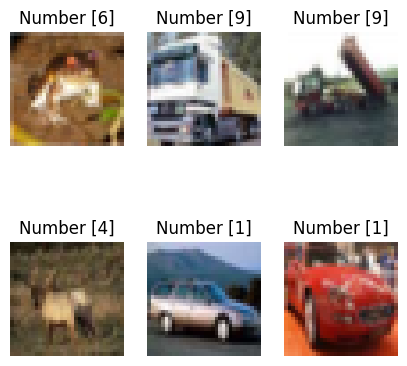

In [5]:
fig, axs = plt.subplots(2, 3, figsize = (5, 5))
plt.gray()

# loop through subplots and add mnist images
for i, ax in enumerate(axs.flat):
    ax.imshow(x_train[i])
    ax.axis('off')
    ax.set_title('Number {}'.format(y_train[i]))
    
# display the figure
plt.show()

# Reshaping the dataset

In [6]:
# Reshape the data to be in the form of (num_samples, num_features) 
x=x_train
x_train = x_train.reshape(x_train.shape[0], 32*32*3) 
x_test = x_test.reshape(x_test.shape[0], 32*32*3) 
  
# Normalize the data 
x_train = x_train/255.0 
x_test = x_test/255.0

## creating a dataframe 

In [7]:
# x_train_flat = x_train.reshape(-1,3072)
feat_cols = ['pixel' + str(i) for i in range(x_train.shape[1])]
df_cifar = pd.DataFrame(x_train, columns = feat_cols)
df_cifar['Label'] = y_train
print('Size of Data Frame: {}'.format(df_cifar.shape))

Size of Data Frame: (50000, 3073)


In [8]:
df_cifar.head()

,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel3063,pixel3064,pixel3065,pixel3066,pixel3067,pixel3068,pixel3069,pixel3070,pixel3071,Label
0,0.231373,0.243137,0.247059,0.168627,0.180392,0.176471,0.196078,0.188235,0.168627,0.266667,...,0.847059,0.721569,0.549020,0.592157,0.462745,0.329412,0.482353,0.360784,0.282353,6
1,0.603922,0.694118,0.733333,0.494118,0.537255,0.533333,0.411765,0.407843,0.372549,0.400000,...,0.560784,0.521569,0.545098,0.560784,0.525490,0.556863,0.560784,0.521569,0.564706,9
2,1.000000,1.000000,1.000000,0.992157,0.992157,0.992157,0.992157,0.992157,0.992157,0.992157,...,0.305882,0.333333,0.325490,0.309804,0.333333,0.325490,0.313725,0.337255,0.329412,9
3,0.109804,0.098039,0.039216,0.145098,0.133333,0.074510,0.149020,0.137255,0.078431,0.164706,...,0.211765,0.184314,0.109804,0.247059,0.219608,0.145098,0.282353,0.254902,0.180392,4
4,0.666667,0.705882,0.776471,0.658824,0.698039,0.768627,0.694118,0.725490,0.796078,0.717647,...,0.294118,0.309804,0.321569,0.278431,0.294118,0.305882,0.286275,0.301961,0.313725,1


# Dimensionality reduction using PCA

In [9]:
# Make an instance of the Model
variance = 0.98 #The higher the explained variance the more accurate the model will remain
pca = PCA(variance)

In [10]:
#fit the data according to our PCA instance
pca.fit(df_cifar)

PCA(n_components=0.98)

In [11]:
print("Number of components before PCA  = " + str(df_cifar.shape[1]))
print("Number of components after PCA 0.98 = " + str(pca.n_components_)) #dimension reduced from 784

Number of components before PCA  = 3073
Number of components after PCA 0.98 = 433


In [12]:
#Transform our data according to our PCA instance
pca_cifar = pca.transform(df_cifar)

In [13]:
print("Dimension of our data after PCA  = " + str(pca_cifar.shape)) 

Dimension of our data after PCA  = (50000, 433)


In [14]:
#To visualise the data inversed from PCA
approximation = pca.inverse_transform(pca_cifar)
print("Dimension of our data after inverse transforming the PCA  = " + str(approximation.shape))

Dimension of our data after inverse transforming the PCA  = (50000, 3073)


In [15]:
#n_clusters = 10 because INDEX has 10 values. Not the best value but a simple logic.
#The value of n_init at 35 yields good results so we will use it. For confirmation us the above code.
k_means = KMeans(init = "k-means++", n_clusters = 10, max_iter = 200)

In [16]:
#fit the data to our k_means model
k_means.fit(pca_cifar)

/Users/aroua/.pyenv/versions/3.8.16/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(max_iter=200, n_clusters=10)

In [17]:
k_means_labels = k_means.labels_ #List of labels of each dataset
print("The list of labels of the clusters are " + str(np.unique(k_means_labels)))

The list of labels of the clusters are [0 1 2 3 4 5 6 7 8 9]


In [18]:
classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']     

In [19]:
predict = k_means.predict(pca_cifar)

In [21]:
G = len(np.unique(k_means_labels)) #Number of labels

In [22]:
x.shape

(50000, 32, 32, 3)

In [23]:
cluster_index= [[] for i in range(G)]
for i, label in enumerate(k_means_labels,0):
    for n in range(G):
        if label == n:
            cluster_index[n].append(i)
        else:
            continue        

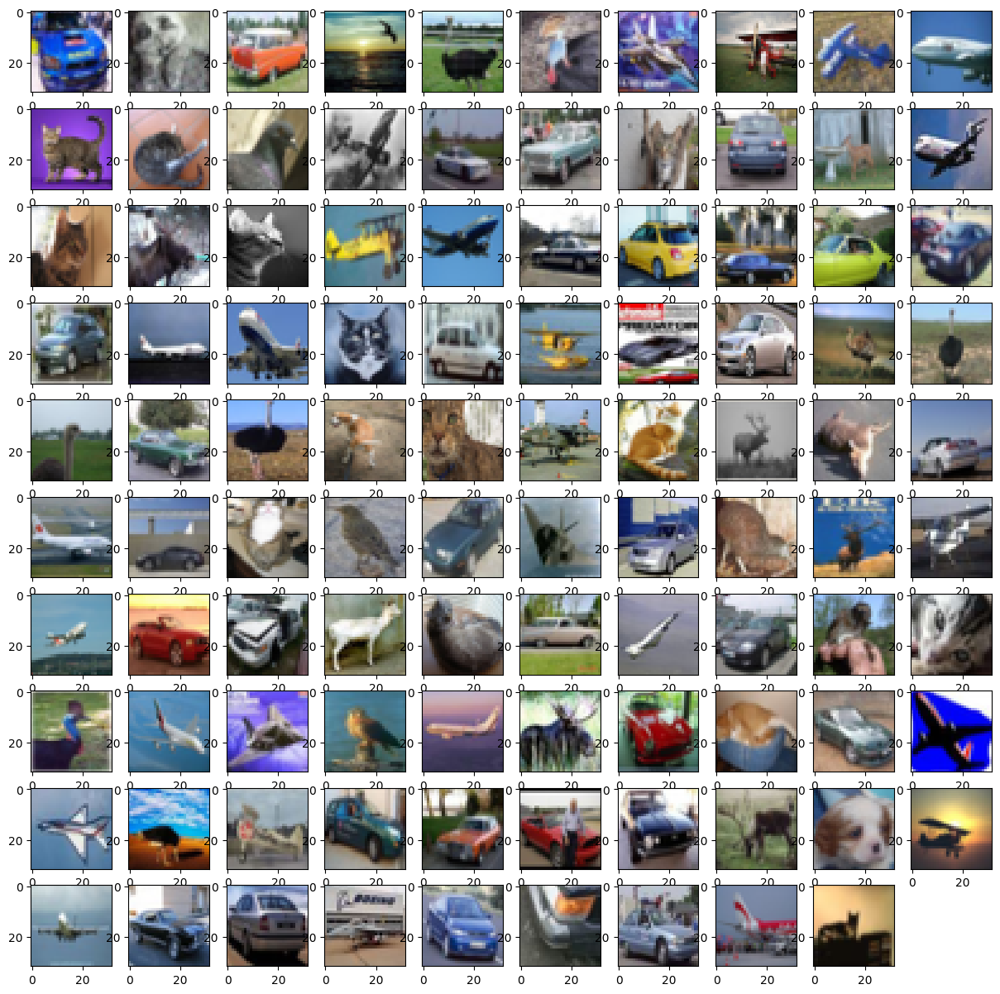

In [24]:
plt.figure(figsize=(15,15));
clust = 4 #enter label number to visualise
num = 100 #num of data to visualize from the cluster
for i in range(1,num): 
    plt.subplot(10, 10, i); #(Number of rows, Number of column per row, item number)
#     plt.imshow(x_train[cluster_index[clust][i+500]].reshape(-1, 32*32*3), cmap = plt.cm.binary);
    plt.imshow(x_train[cluster_index[clust][i+500]].reshape(32,32,3), cmap = plt.cm.binary);
    
plt.show()

In [25]:
Y_clust = [[] for i in range(G)]
for n in range(G):
    Y_clust[n] = y_train[cluster_index[n]] #Y_clust[0] contains array of "correct" category from y_train for the cluster_index[0]
    assert(len(Y_clust[n]) == len(cluster_index[n])) #dimension confirmation

In [26]:
#counts the number of each category in each cluster
def counter(cluster):
    unique, counts = np.unique(cluster, return_counts=True)
    label_index = dict(zip(unique, counts))
    return label_index

In [27]:
label_count= [[] for i in range(G)]
for n in range(G):
    label_count[n] = counter(Y_clust[n])

label_count[1] #Number of items of a certain category in cluster 1

{0: 271,
 1: 681,
 2: 313,
 3: 589,
 4: 287,
 5: 983,
 6: 551,
 7: 437,
 8: 630,
 9: 291}

In [28]:
classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']  
class_names = {0:'airplane', 1:'automobile',2: 'bird',3: 'cat',4: 'deer',5:
               'dog',6: 'frog', 7:'horse',8:  'ship',9: 'truck'} #Dictionary of class names

#A function to plot a bar graph for visualising the number of items of certain category in a cluster
def plotter(label_dict):
    plt.bar(range(len(label_dict)), list(label_dict.values()), align='center')
    a = []
    for i in [*label_dict]: a.append(class_names[i])
    plt.xticks(range(len(label_dict)), list(a), rotation=45, rotation_mode='anchor')

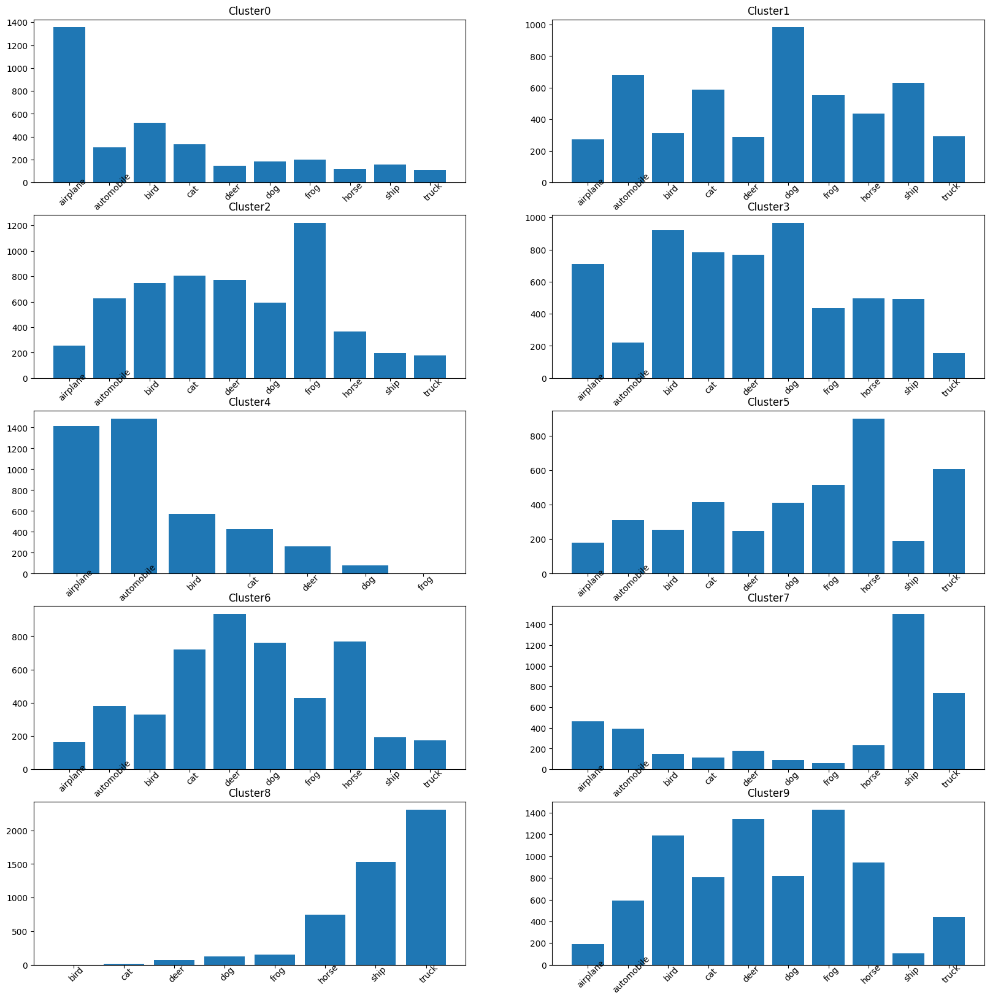

In [29]:
#Bar graph with the number of items of different categories clustered in it
plt.figure(figsize=(20,20))
for i in range (1,11):
    plt.subplot(5, 2, i)
    plotter(label_count[i-1]) 
    plt.title("Cluster" + str(i-1))

In [30]:
k_means_cluster_centers = k_means.cluster_centers_ #numpy array of cluster centers
k_means_cluster_centers.shape #comes from 10 clusters and 420 features 

(10, 433)

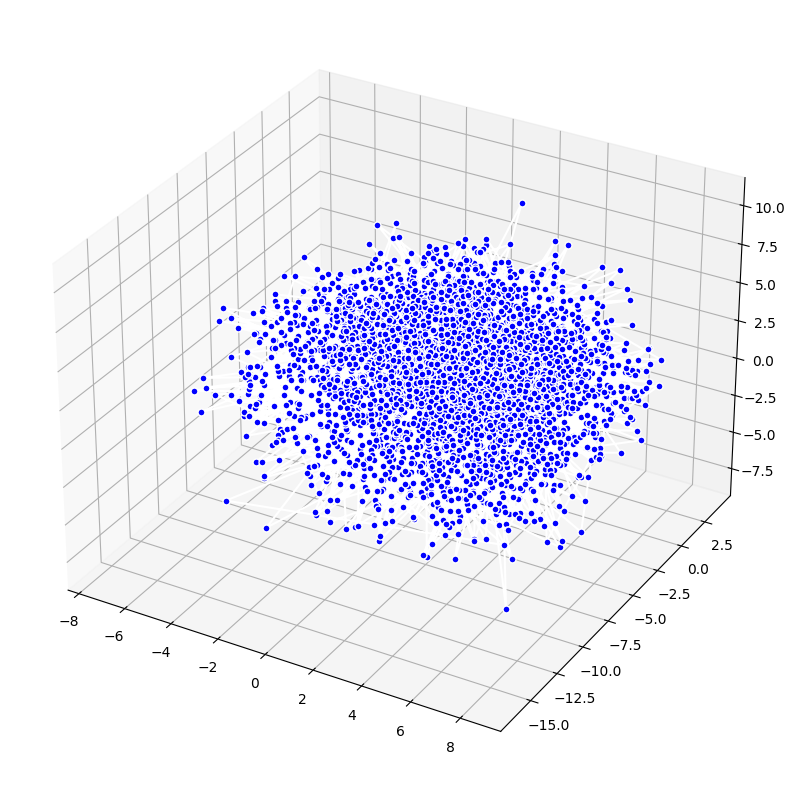

In [31]:
#cluster visualisation
my_members = (k_means_labels == 4) #Enter different Cluster number to view its 3D plot
my_members.shape
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(1,1,1,projection='3d')
ax.plot(pca_cifar[my_members, 0], pca_cifar[my_members,1],pca_cifar[my_members,2], 'w', markerfacecolor="blue", marker='.',markersize=10)

In [32]:
import plotly as py
import plotly.graph_objs as go
import plotly.express as px

In [33]:

#3D Plotly Visualisation of Clusters using go

layout = go.Layout(
    title='<b>Cluster Visualisation</b>',
    yaxis=dict(
        title='<i>Y</i>'
    ),
    xaxis=dict(
        title='<i>X</i>'
    )
)

colors = ['red','green' ,'blue','purple','magenta','yellow','cyan','maroon','teal','black']
trace = [ go.Scatter3d() for _ in range(11)]
for i in range(0,10):
    my_members = (k_means_labels == i)
    index = [h for h, g in enumerate(my_members) if g]
    trace[i] = go.Scatter3d(
            x=pca_cifar[my_members, 0],
            y=pca_cifar[my_members, 1],
            z=pca_cifar[my_members, 2],
            mode='markers',
            marker = dict(size = 2,color = colors[i]),
            hovertext=index,
            name='Cluster'+str(i),
   
            )

fig = go.Figure(data=[trace[0],trace[1],trace[2],trace[3],trace[4],trace[5],trace[6],trace[7],trace[8],trace[9]], layout=layout)
    
py.offline.iplot(fig)

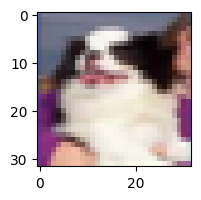

In [35]:
#If you hover over the points in the above plots you get an index value
plt.figure(figsize=(2,2));
n = 37085 #Use that value here to visualise the selected data
plt.imshow(x_train[n].reshape(32, 32,3), cmap = plt.cm.binary)
plt.show()

In [36]:
from sklearn.cluster import DBSCAN

In [37]:
dbscan=DBSCAN(eps=8).fit(pca_cifar)

In [38]:
labels = dbscan.labels_

In [45]:
from sklearn.metrics import silhouette_score, davies_bouldin_score
score = silhouette_score(pca_cifar,k_means_labels)

In [46]:
print('Silhouetter Score: %.3f' % score)

Silhouetter Score: 0.057


In [49]:
davies_score=davies_bouldin_score(pca_cifar,k_means_labels)
print('davies Score: %.3f' % davies_score)

davies Score: 2.857


In [50]:
davies_score=davies_bouldin_score(pca_cifar,labels)
print('davies Score: %.3f' % davies_score)

davies Score: 3.016


In [51]:
score = silhouette_score(pca_cifar,labels)
print('Silhouetter Score: %.3f' % score)

Silhouetter Score: -0.209
